---

# <center>Introdução ao YOLOv8</center>

---

## ⚙️ 1. CONFIGURAÇÃO DO AMBIENTE

### 1.1 Carregando Pacotes

In [10]:
# PyTorch
import torch

# Ambiente de desenvolvimento
import os
import warnings

# YOLO
from ultralytics import YOLO

# Visualização de Imagens & Vídeos
from base64 import b64encode
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from IPython.display import HTML
from IPython.display import Image

In [2]:
# Ignorando avisos desnecessários
warnings.filterwarnings("ignore")

### 1.2 Ambiente de Desenvolvimento

In [3]:
# Versões Python
%reload_ext watermark
%watermark -v -m -iv

Python implementation: CPython
Python version       : 3.12.1
IPython version      : 8.21.0

Compiler    : GCC 11.2.0
OS          : Linux
Release     : 5.15.0-94-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

matplotlib: 3.8.2
torch     : 2.2.0
imageio   : 2.33.1



In [4]:
# Dispositivo usado (CPU or GPU)
device = torch.device("cuda:0") if torch.cuda.is_available() else "cpu"
print(f"Dispositivo Usado: {device}")

Dispositivo Usado: cpu


## 🔍 2. DETECÇÃO DE OBJETOS

### 2.1 Detecção de Objetos em Imagem (BÁSICO)

O comando utilizado para detecção de objetos com YOLO tem vários parâmetros, cada um especificando uma parte importante do processo de detecção. Abaixo estão os detalhes de cada parâmetro:

- `task=detect`: Especifica a tarefa a ser realizada pelo YOLO. Neste caso, `detect` indica que o comando deve executar a detecção de objetos na imagem fornecida.

- `mode=predict`: Define o modo de operação. O modo `predict` é utilizado para prever ou identificar objetos em imagens ou vídeos sem a necessidade de treinar o modelo novamente.

- `model=yolov8x.pt`: Indica o modelo pré-treinado a ser usado para a detecção de objetos. `yolov8x.pt` é o arquivo que contém os pesos do modelo YOLOv8, otimizado para uma detecção rápida, mantendo um bom equilíbrio entre velocidade e precisão.

- `source='images/image1.jpg'`: Especifica o caminho para a imagem de entrada na qual a detecção de objetos será realizada. Pode ser um caminho local para um arquivo ou uma URL para uma imagem na internet.

- `show_conf=False`: Determina se a confiança (probabilidade) das detecções será exibida junto aos objetos detectados. Quando definido como `False`, as pontuações de confiança não são mostradas, tornando a saída visualmente mais limpa, especialmente útil em apresentações ou quando a confiança não é crítica para a análise subsequente.

- `save_crop=True`: Quando ativado (`True`), este parâmetro instrui o YOLO a salvar recortes (crops) dos objetos detectados em um diretório separado. Isso é particularmente útil para aplicações que necessitam de análises ou processamentos posteriores em objetos individuais detectados na imagem.

In [5]:
# detecção de objetos na imagem 'images/image1.jpg' usando o modelo YOLOv8x. 
!yolo task=detect mode=predict model=yolov8x.pt source='images/image1.jpg' show_conf=False save_crop=True

Ultralytics YOLOv8.1.0 🚀 Python-3.12.1 torch-2.2.0+cu121 CPU (Intel Core(TM) i5-10210U 1.60GHz)
YOLOv8x summary (fused): 268 layers, 68200608 parameters, 0 gradients, 257.8 GFLOPs

image 1/1 /home/murilo/Documentos/03.YOLOv8/01.INTRODUCTION/02.Aula/images/image1.jpg: 448x640 12 persons, 1 bicycle, 1 bus, 1 traffic light, 2 backpacks, 5 handbags, 715.5ms
Speed: 2.1ms preprocess, 715.5ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


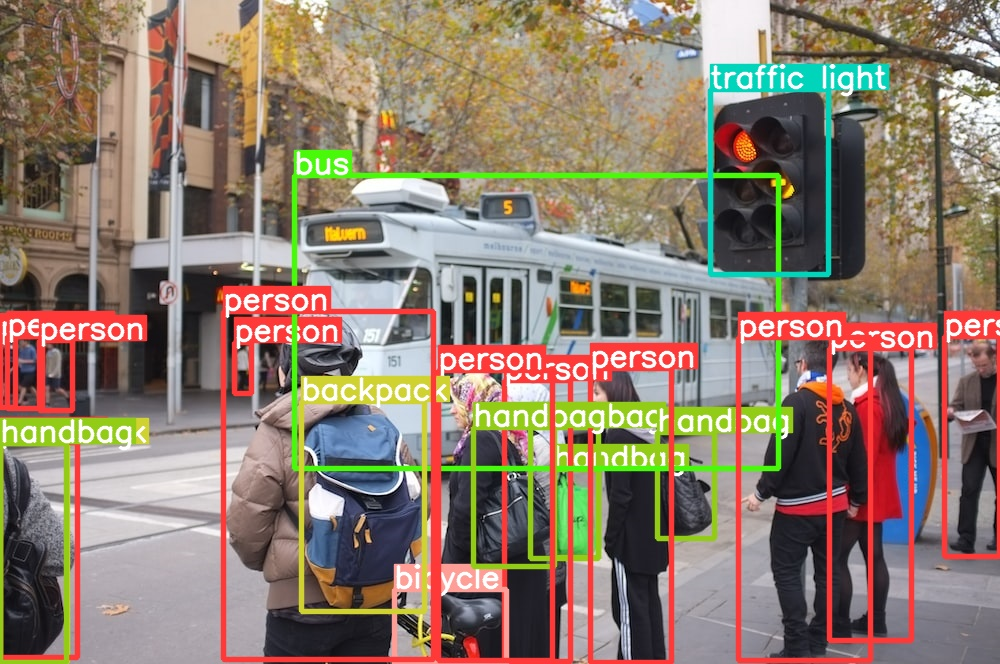

In [6]:
# Visualizando resultados
Image("runs/detect/predict/image1.jpg")

### 2.2 Objetos Detectados na Imagem

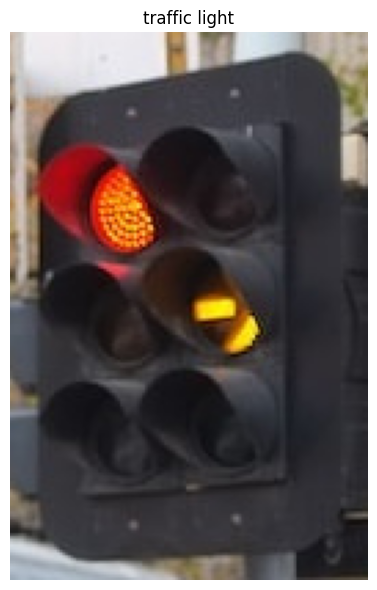

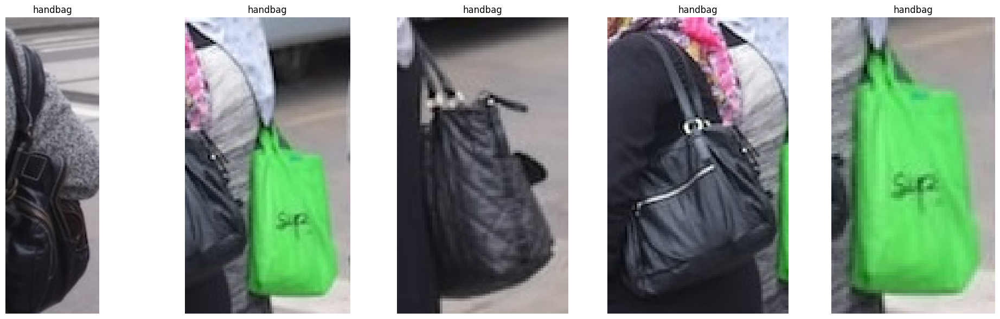

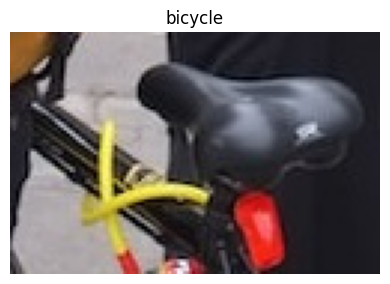

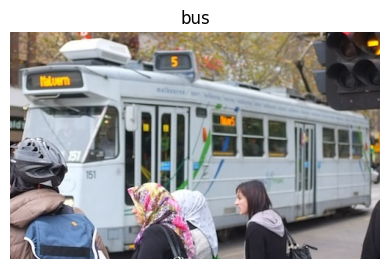

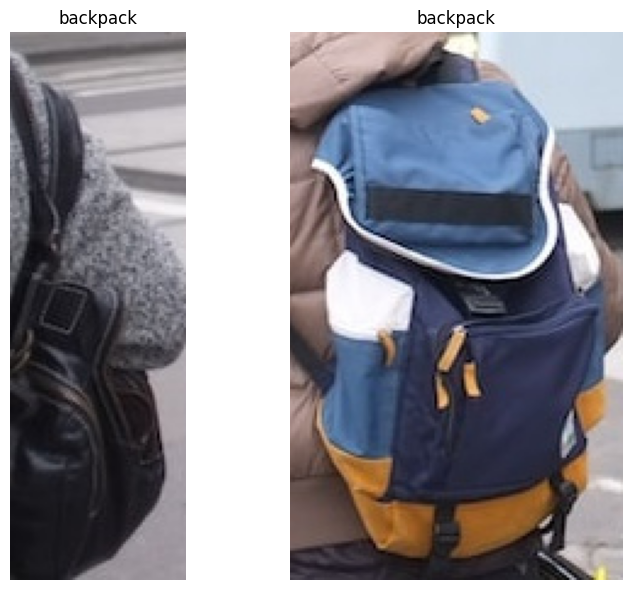

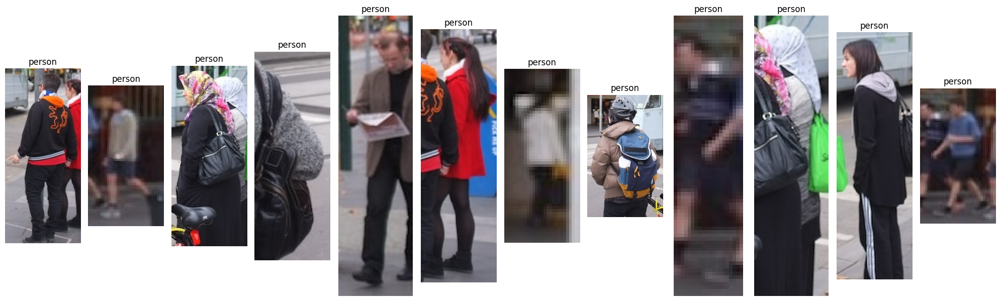

In [7]:
# Configurações para o tamanho de cada subplot
largura_por_imagem = 4  # Largura em polegadas para cada imagem
altura_figura = 6       # Altura fixa em polegadas para a figura

for type_object in os.listdir('runs/detect/predict/crops'):
    images_path = f'runs/detect/predict/crops/{type_object}'
    images = os.listdir(images_path)
    n_plots = len(images)
    
    # Calcula a largura total da figura com base no número de imagens
    largura_figura = largura_por_imagem * n_plots
    
    # Ajusta para um mínimo e máximo razoável
    largura_figura = max(min(largura_figura, 20), largura_por_imagem)  # Exemplo: mínimo de 4 e máximo de 20 polegadas
    
    fig, axs = plt.subplots(1, n_plots, figsize=(largura_figura, altura_figura), squeeze=False)
    
    for i, img in enumerate(images):
        img_path = os.path.join(images_path, img)
        image = imageio.imread(img_path)
        axs[0, i].imshow(image)
        axs[0, i].set_title(type_object)
        axs[0, i].axis('off')
    
    plt.tight_layout()
    plt.show()

### 2.3 Detecção de Objetos em Vídeo (Básico)

In [8]:
# detecção de objetos no vídeo 'videoss/demo.mp4' usando o modelo YOLOv8x. 
!yolo task=detect mode=predict model=yolov8x.pt source='videos/demo.mp4' conf=0.6 > /dev/null 2>&1

In [13]:
# Caminhos dos arquivos
save_path = "runs/detect/predict2/demo.avi"
compressed_path = "result_compressed.mp4"

# Comando ffmpeg modificado para suprimir avisos e sobrescrever arquivos existentes automaticamente
ffmpeg_command = f"ffmpeg -y -i {save_path} -vcodec libx264 {compressed_path} -hide_banner -loglevel error"

# Executa o comando ffmpeg
os.system(ffmpeg_command)

# Exibir o vídeo no notebook
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
display(HTML(f"""
    <video width='640' height='480' controls>
        <source src="{data_url}" type="video/mp4">
    </video>
"""))

## 🎋 3. SEGMENTAÇÃO

### 3.1 Segmentação de Imagem

In [15]:
!yolo task=segment mode=predict model=yolov8x-seg.pt source='images/image1.jpg' show_labels=False show_conf=False boxes=False

WARNING ⚠️ 'boxes' is deprecated and will be removed in 'ultralytics 8.299999999999999' in the future. Please use 'show_boxes' instead.
100%|████████████████████████████████████████| 137M/137M [01:07<00:00, 2.15MB/s]
Ultralytics YOLOv8.1.0 🚀 Python-3.12.1 torch-2.2.0+cu121 CPU (Intel Core(TM) i5-10210U 1.60GHz)
YOLOv8x-seg summary (fused): 295 layers, 71797696 parameters, 0 gradients, 344.1 GFLOPs

image 1/1 /home/murilo/Documentos/03.YOLOv8/01.INTRODUCTION/02.Aula/images/image1.jpg: 448x640 13 persons, 1 bicycle, 1 train, 2 traffic lights, 1 backpack, 5 handbags, 1054.3ms
Speed: 2.9ms preprocess, 1054.3ms inference, 21.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/segment/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


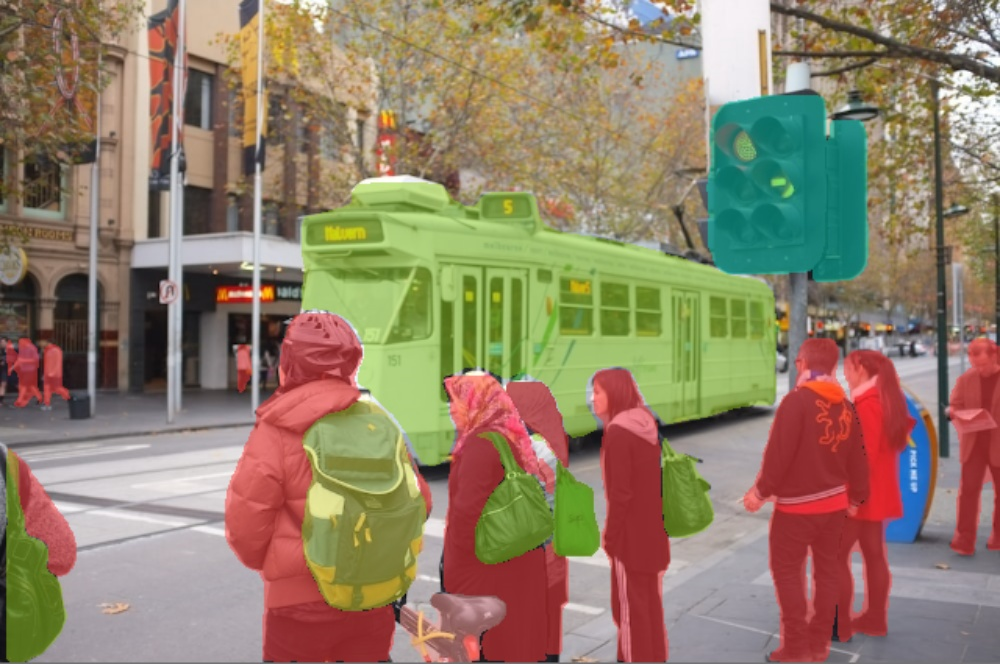

In [16]:
# Visualizando Resultado
Image('runs/segment/predict/image1.jpg')